#About Dataset
salaries dataset generally provides information about the employees of an organization in relation to their compensation. It typically includes details such as how much each employee is paid (their salary), their job titles, the departments they work in, and possibly additional information like their level of experience, education, and employment history within the organization.

# Features
- 'Id'
- 'EmployeeName'
- 'JobTitle'
- 'BasePay'
- 'OvertimePay'
- 'OtherPay'
- 'Benefits'
- 'TotalPay' -> salary
- 'TotalPayBenefits'
- 'Year'
- 'Notes'
- 'Agency'
- 'Status'


# Tasks

1. **Basic Data Exploration**: Identify the number of rows and columns in the dataset, determine the data types of each column, and check for missing values in each column.

2. **Descriptive Statistics**: Calculate basic statistics mean, median, mode, minimum, and maximum salary, determine the range of salaries, and find the standard deviation.

3. **Data Cleaning**: Handle missing data by suitable method with explain why you use it.

4. **Basic Data Visualization**: Create histograms or bar charts to visualize the distribution of salaries, and use pie charts to represent the proportion of employees in different departments.

5. **Grouped Analysis**: Group the data by one or more columns and calculate summary statistics for each group, and compare the average salaries across different groups.

6. **Simple Correlation Analysis**: Identify any correlation between salary and another numerical column, and plot a scatter plot to visualize the relationship.

8. **Summary of Insights**: Write a brief report summarizing the findings and insights from the analyses.

# Very Important Note
There is no fixed or singular solution for this assignment, so if anything is not clear, please do what you understand and provide an explanation.

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


# Load your dataset
df = pd.read_csv('Salaries.csv')
df.head()


,Id,EmployeeName,JobTitle,BasePay,OvertimePay,OtherPay,Benefits,TotalPay,TotalPayBenefits,Year,Notes,Agency,Status
0,1,NATHANIEL FORD,GENERAL MANAGER-METROPOLITAN TRANSIT AUTHORITY,167411.18,0.00,400184.25,NaN,567595.43,567595.43,2011,NaN,San Francisco,NaN
1,2,GARY JIMENEZ,CAPTAIN III (POLICE DEPARTMENT),155966.02,245131.88,137811.38,NaN,538909.28,538909.28,2011,NaN,San Francisco,NaN
2,3,ALBERT PARDINI,CAPTAIN III (POLICE DEPARTMENT),212739.13,106088.18,16452.60,NaN,335279.91,335279.91,2011,NaN,San Francisco,NaN
3,4,CHRISTOPHER CHONG,WIRE ROPE CABLE MAINTENANCE MECHANIC,77916.00,56120.71,198306.90,NaN,332343.61,332343.61,2011,NaN,San Francisco,NaN
4,5,PATRICK GARDNER,"DEPUTY CHIEF OF DEPARTMENT,(FIRE DEPARTMENT)",134401.60,9737.00,182234.59,NaN,326373.19,326373.19,2011,NaN,San Francisco,NaN


In [5]:
df.columns

Index(['Id', 'EmployeeName', 'JobTitle', 'BasePay', 'OvertimePay', 'OtherPay',
       'Benefits', 'TotalPay', 'TotalPayBenefits', 'Year', 'Notes', 'Agency',
       'Status'],
      dtype='object')

##  1) Basic Data Exploration : 
Identify the number of rows and columns in the dataset, determine the data types of each column, and check for missing values in each column.

In [6]:
print(f"Dataset has {df.shape[0]} rows , {df.shape[1]} columns\n")
print(f"Datatype of each column : \n{df.dtypes}\n")
print(f"Number of missing data for each column : \n{df.isna().sum()}")

Dataset has 148654 rows , 13 columns

Datatype of each column : 
Id                    int64
EmployeeName         object
JobTitle             object
BasePay             float64
OvertimePay         float64
OtherPay            float64
Benefits            float64
TotalPay            float64
TotalPayBenefits    float64
Year                  int64
Notes               float64
Agency               object
Status              float64
dtype: object

Number of missing data for each column : 
Id                       0
EmployeeName             0
JobTitle                 0
BasePay                609
OvertimePay              4
OtherPay                 4
Benefits             36163
TotalPay                 0
TotalPayBenefits         0
Year                     0
Notes               148654
Agency                   0
Status              148654
dtype: int64


## 2) Descriptive Statistics: 
Calculate basic statistics mean, median, mode, minimum, and maximum salary, determine the range of salaries, and find the standard deviation.

In [7]:
salary = df['TotalPay']
mean_salary = salary.mean()
median_salary = salary.median()
mode_salary = salary.mode().iloc[0] 
min_salary = salary.min()
max_salary = salary.max()
std_salary=salary.std()

print(f"Mean Salary: {mean_salary}")
print(f"Median Salary: {median_salary}")
print(f"Mode Salary: {mode_salary}")
print(f"Minimum Salary: {min_salary}")
print(f"Maximum Salary: {max_salary}")
print(f"Range of Salaries from {min_salary} to {max_salary}")
print(f"Standard Deviation {std_salary}")

Mean Salary: 74768.32197169267
Median Salary: 71426.60999999999
Mode Salary: 0.0
Minimum Salary: -618.13
Maximum Salary: 567595.43
Range of Salaries from -618.13 to 567595.43
Standard Deviation 50517.00527394987


## 3) Data Cleaning: 
Handle missing data by suitable method with explain why you use it.

In [8]:
df.isna().sum()

Id                       0
EmployeeName             0
JobTitle                 0
BasePay                609
OvertimePay              4
OtherPay                 4
Benefits             36163
TotalPay                 0
TotalPayBenefits         0
Year                     0
Notes               148654
Agency                   0
Status              148654
dtype: int64

In [9]:
# Drop column Notes and Status because we have 148654 records and all of them is NaN value so we can delete them

df.drop(columns=['Status','Notes'],inplace=True,axis=1)


OtherPay
 0.00       41600
 624.00      2092
 250.00       907
 648.00       739
 3486.00      516
            ...  
 1753.26        1
 3271.00        1
 9120.78        1
 8048.70        1
-618.13         1
Name: count, Length: 83225, dtype: int64


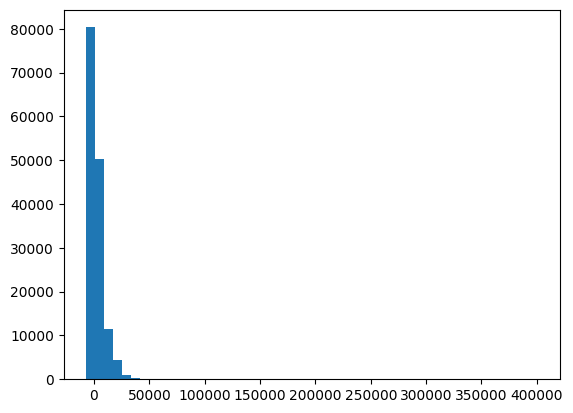

In [10]:
# About OtherPay column we have 4 records that has NaN values 
# we have most of column has 0 value with frequency 41600 and the second higher value is 624 with frequency 2092
# so most of the non Nan values is 0 so we can fill Nan values with Zero number

print(df['OtherPay'].value_counts())
plt.hist(df['OtherPay'],bins=50)
df['OtherPay'].fillna(0,inplace=True)


OvertimePay
0.00        77321
681.23         41
10.68          41
152.13         38
1314.78        27
            ...  
30132.07        1
22953.71        1
4301.91         1
9311.49         1
56.77           1
Name: count, Length: 65998, dtype: int64


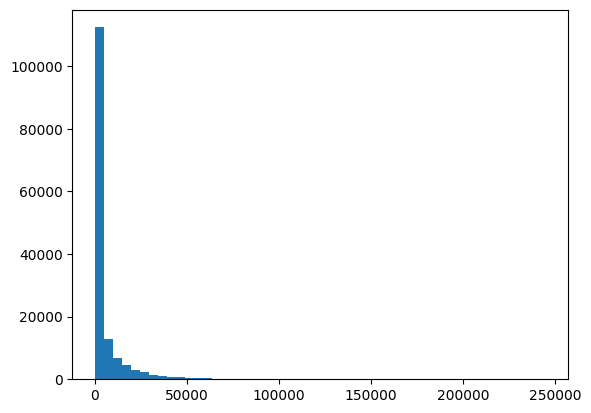

In [11]:
# About OvertimePay column we have 4 records that has NaN values 
# we have most of column has 0 value with frequency 77321 and the second higher value is 681.23 with frequency 41 (very low according to 0 counts ) 
# so most of the non Nan values is 0 so we can fill Nan values with Zero number

print(df['OvertimePay'].value_counts())
plt.hist(df['OvertimePay'],bins=50)
df['OvertimePay'].fillna(0,inplace=True)

In [12]:
# About BasePay column we have 609 records that has NaN values 

# we have outliers that above 250000
print("Number of outliers that above of 250000 : ", (df['BasePay']>250000).sum())

# so we can replace nan values with median values 

df['BasePay'].fillna(df['BasePay'].median(),inplace=True)

Number of outliers that above of 250000 :  76


In [13]:
# About Benefits column we have 36163 records that has NaN values 

# we have small number of outliers that above 85000
print("Number of outliers that above of 85000 : ", (df['Benefits']>85000).sum())

# so we can replace nan values with mean values 
df['Benefits'].fillna(df['Benefits'].mean(),inplace=True)

Number of outliers that above of 85000 :  9


### 4) Basic Data Visualization: 
Create histograms or bar charts to visualize the distribution of salaries, and use pie charts to represent the proportion of employees in different departments.

(array([5.3031e+04, 6.3391e+04, 2.5789e+04, 5.7690e+03, 5.6600e+02,
        1.0000e+02, 5.0000e+00, 0.0000e+00, 1.0000e+00, 2.0000e+00]),
 array([  -618.13 ,  56203.226, 113024.582, 169845.938, 226667.294,
        283488.65 , 340310.006, 397131.362, 453952.718, 510774.074,
        567595.43 ]),
 <BarContainer object of 10 artists>)

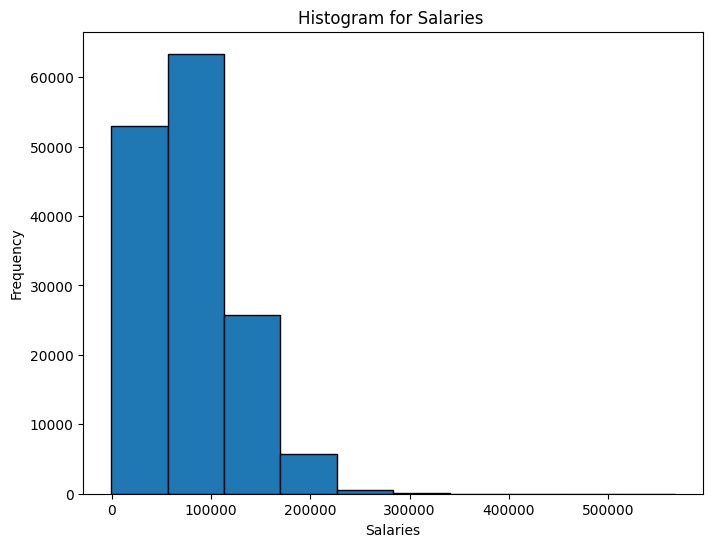

In [14]:
# Distribution of salaries using histograms:
plt.figure(figsize=(8, 6))
plt.title('Histogram for Salaries ')
plt.xlabel('Salaries')
plt.ylabel('Frequency')
plt.hist(df['TotalPay'], bins=10, edgecolor='black')


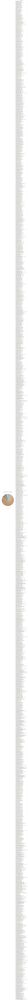

In [15]:
# Count the number of employees in each department
department_counts = df['JobTitle'].value_counts()

legend_labels = [f"{dept} ({count} - {count/sum(department_counts)*100:.5f}%)"
                 for dept, count in zip(department_counts.index, department_counts)]
# Plot a pie chart
plt.figure(figsize=(8, 8))
plt.pie(department_counts, startangle=90, colors=plt.cm.Paired.colors)
plt.legend(legend_labels, title='Departments', loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
plt.title('Proportion of Employees in Each Department')
plt.show()

### 5) Grouped Analysis: 
Group the data by one or more columns and calculate summary statistics for each group, and compare the average salaries across different groups.

In [16]:
summary_stats = df.groupby('JobTitle')['TotalPay'].agg(['count', 'mean', 'median', 'std', 'min', 'max'])
summary_stats

,count,mean,median,std,min,max
JobTitle,,,,,,
ACCOUNT CLERK,83,44035.664337,49777.820,13170.742908,614.00,60838.20
ACCOUNTANT,5,47429.268000,60076.240,27137.331315,1148.40,65392.01
ACCOUNTANT INTERN,48,29031.742917,17658.505,20711.322649,2981.53,58799.53
"ACPO,JuvP, Juv Prob (SFERS)",1,62290.780000,62290.780,NaN,62290.78,62290.78
ACUPUNCTURIST,1,67594.400000,67594.400,NaN,67594.40,67594.40
...,...,...,...,...,...,...
X-RAY LABORATORY AIDE,26,52705.880385,60333.125,19760.943417,5343.69,85077.40
X-Ray Laboratory Aide,100,50823.942700,60047.290,24170.083004,1007.00,99812.97
"YOUTH COMMISSION ADVISOR, BOARD OF SUPERVISORS",1,53632.870000,53632.870,NaN,53632.87,53632.87


In [17]:
sorted_summary = summary_stats.sort_values(by='mean', ascending=False)
sorted_summary

,count,mean,median,std,min,max
JobTitle,,,,,,
GENERAL MANAGER-METROPOLITAN TRANSIT AUTHORITY,2,399211.275000,399211.275,238131.155690,230827.12,567595.43
Chief Investment Officer,1,339653.700000,339653.700,NaN,339653.70,339653.70
Chief of Police,3,329183.646667,326716.760,9118.772821,321552.11,339282.07
"Chief, Fire Department",3,325971.683333,326233.440,11083.523432,314759.60,336922.01
DEPUTY DIRECTOR OF INVESTMENTS,1,307899.460000,307899.460,NaN,307899.46,307899.46
...,...,...,...,...,...,...
"Commissioner 16.700c, No Pay",50,25.760000,0.000,182.150707,0.00,1288.00
IS Technician Assistant,1,0.000000,0.000,NaN,0.00,0.00
Not provided,4,0.000000,0.000,0.000000,0.00,0.00


### 5) Simple Correlation Analysis: 
Identify any correlation between salary and another numerical column, and plot a scatter plot to visualize the relationship.

In [18]:
df.corr(numeric_only=True)

,Id,BasePay,OvertimePay,OtherPay,Benefits,TotalPay,TotalPayBenefits,Year
Id,1.000000,-0.204724,-0.081523,-0.100419,-0.229712,-0.211478,-0.092190,0.968171
BasePay,-0.204724,1.000000,0.266688,0.283747,0.806848,0.950689,0.943166,0.033682
OvertimePay,-0.081523,0.266688,1.000000,0.316595,0.268538,0.504860,0.467984,0.027870
OtherPay,-0.100419,0.283747,0.316595,1.000000,0.203621,0.470499,0.422345,-0.002515
Benefits,-0.229712,0.806848,0.268538,0.203621,1.000000,0.782687,0.843039,-0.027393
TotalPay,-0.211478,0.950689,0.504860,0.470499,0.782687,1.000000,0.977313,0.032090
TotalPayBenefits,-0.092190,0.943166,0.467984,0.422345,0.843039,0.977313,1.000000,0.151947
Year,0.968171,0.033682,0.027870,-0.002515,-0.027393,0.032090,0.151947,1.000000


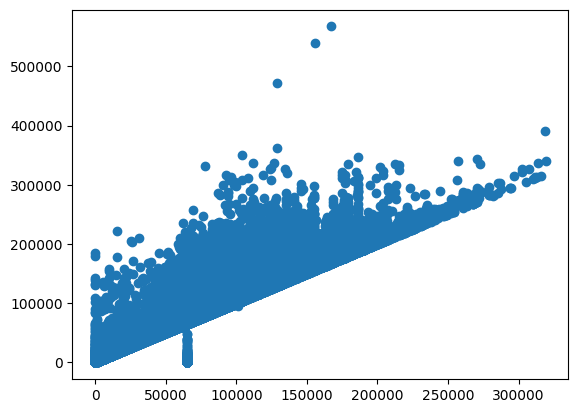

In [19]:
# there are a relation between salary and Basepay 
plt.scatter(df['BasePay'],df['TotalPay'])
# by increasing the BasePay value the salary increases

### 7) Summary of Insights: 
Write a brief report summarizing the findings and insights from the analyses.

## Salary Dataset Analysis Summary

### 1. Overall Mean Salary:
- The mean salary for all departments is approximately 74,768 .

### 2. Salary Range:
- The majority of salaries fall within the range of  56,203  to   113,025.

### 3. Largest Department by Number of Employees:
- The largest department in terms of the number of employees is "Transit Operator," with a total of 7,036 employees.

### 4. Second Largest Department by Number of Employees:
- The second-largest department is "Special Nurse," employing 4,389 individuals.

### 5. Department with the Largest Mean Salary:
- The department with the largest mean salary is "GENERAL MANAGER-METROPOLITAN TRANSIT AUTHORITY" with an average salary of 399,211 

### 6. Correlation Analysis:
- There is a positive correlation between salary and base pay, overtime pay, other pay, and total pay benefits. As these components increase, the salary tends to increase as well.


# Good Luck!